# isomap - eigenvalues comparison

Here we compare the isomap result with the one we get from the decomposition (eigenvalues). We expect to observe a smaller dimensionality for the isomap case. We will generate in the follow the three paradigm we have been dealing with. 

In [1]:
%matplotlib inline

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

In [30]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.neighbors import NearestNeighbors, kneighbors_graph
from sklearn.utils.deprecation import deprecated
from sklearn.utils.validation import check_is_fitted
from sklearn.utils.graph import graph_shortest_path
from sklearn.decomposition import KernelPCA
from sklearn.preprocessing import KernelCenterer


class ReducedIsomap(TransformerMixin, BaseEstimator):
    """Main reference here
    https://github.com/scikit-learn/scikit-learn/blob/b194674c4/sklearn/manifold/_isomap.py#L16
    The modification we apply here is to the dimensionality reduction,
    in case of instability. In KernelPCA
    """
    def __init__(self, n_neighbors=5, n_components=2, eigen_solver='auto',
                 tol=0, max_iter=None, path_method='auto',
                 neighbors_algorithm='auto', n_jobs=None, metric='minkowski',
                 p=2, metric_params=None):
        self.n_neighbors = n_neighbors
        self.n_components = n_components
        self.eigen_solver = eigen_solver
        self.tol = tol
        self.max_iter = max_iter
        self.path_method = path_method
        self.neighbors_algorithm = neighbors_algorithm
        self.n_jobs = n_jobs
        self.metric = metric
        self.p = p
        self.metric_params = metric_params
        
    
    def _fit_transform(self, X):

        self.nbrs_ = NearestNeighbors(n_neighbors=self.n_neighbors,
                                      algorithm=self.neighbors_algorithm,
                                      metric=self.metric, p=self.p,
                                      metric_params=self.metric_params,
                                      n_jobs=self.n_jobs)
        self.nbrs_.fit(X)

        self.kernel_pca_ = KernelPCA(n_components=self.n_components,
                                     kernel="precomputed",
                                     remove_zero_eig=True,
                                     eigen_solver=self.eigen_solver,
                                     tol=self.tol, max_iter=self.max_iter,
                                     n_jobs=self.n_jobs)

        kng = kneighbors_graph(self.nbrs_, self.n_neighbors,
                               metric=self.metric, p=self.p,
                               metric_params=self.metric_params,
                               mode='distance', n_jobs=self.n_jobs)

        self.dist_matrix_ = graph_shortest_path(kng,
                                                method=self.path_method,
                                                directed=False)
        G = self.dist_matrix_ ** 2
        G *= -0.5

        self.embedding_ = self.kernel_pca_.fit_transform(G)

    def fit_transform(self, X, y=None):
        """Fit the model from data in X and transform X.
        Parameters
        ----------
        X : {array-like, sparse graph, BallTree, KDTree}
            Training vector, where n_samples in the number of samples
            and n_features is the number of features.
        y : Ignored
        Returns
        -------
        X_new : array-like, shape (n_samples, n_components)
        """
        self._fit_transform(X)
        return self.embedding_

In [31]:
(X_tr, y_tr), (X_ts, y_ts) = tf.keras.datasets.mnist.load_data()

To implement on the laptop, we use a subset of mnist, $n=1000$ points per class.

----------------------
CLASS  0
Linear eigendecomposition: 
476
Isomap with NN 2


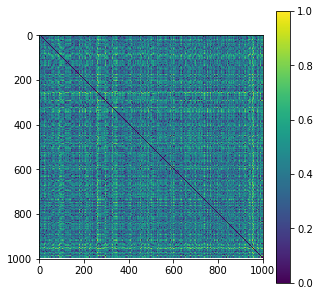

Eigs


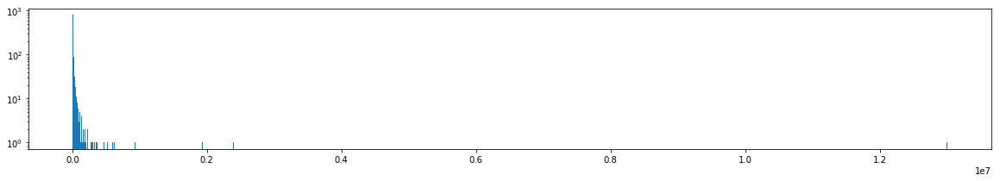

isomap 523
----------------------
CLASS  1
Linear eigendecomposition: 
376
Isomap with NN 2


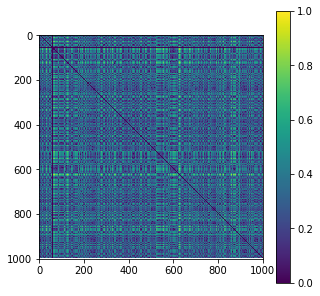

Eigs


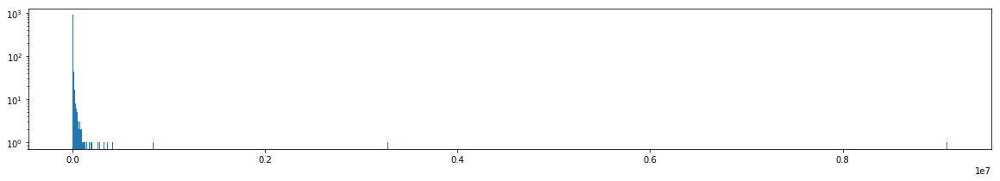

isomap 533
----------------------
CLASS  2
Linear eigendecomposition: 
528
Isomap with NN 2


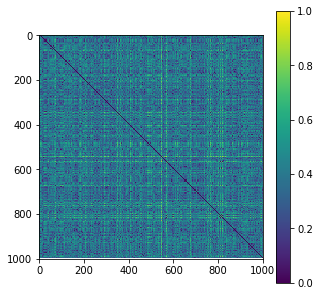

Eigs


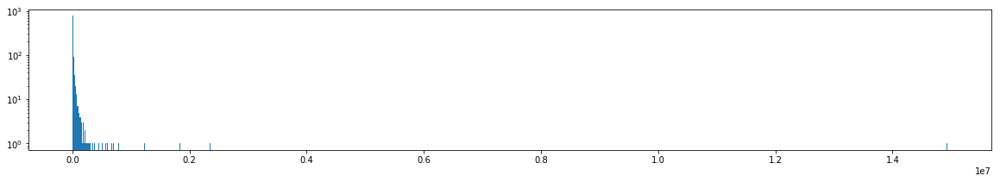

isomap 509
----------------------
CLASS  3
Linear eigendecomposition: 
506
Isomap with NN 2


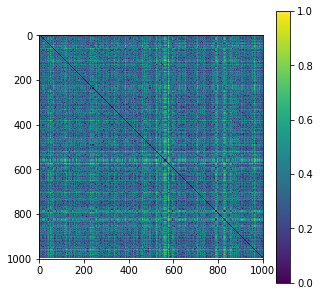

Eigs


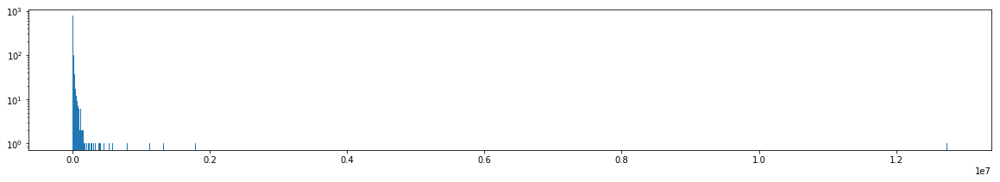

isomap 517
----------------------
CLASS  4
Linear eigendecomposition: 
511
Isomap with NN 2


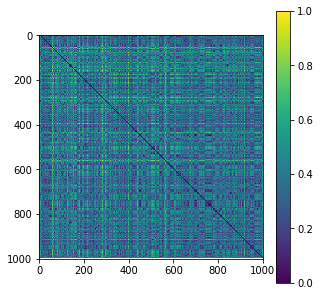

Eigs


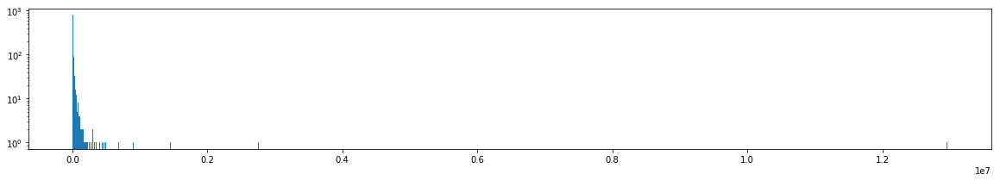

isomap 518
----------------------
CLASS  5
Linear eigendecomposition: 
518
Isomap with NN 2


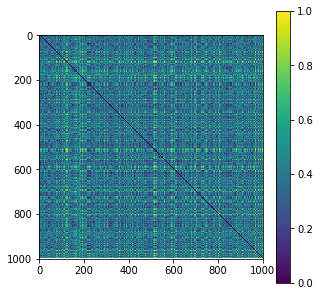

Eigs


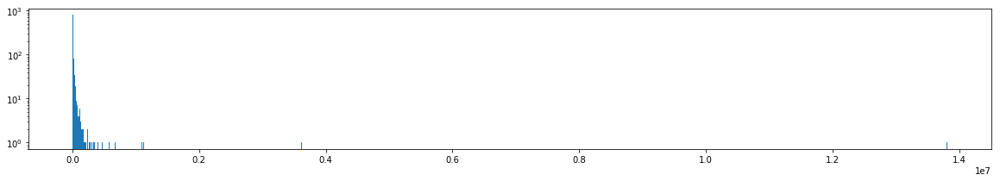

isomap 517
----------------------
CLASS  6
Linear eigendecomposition: 
484
Isomap with NN 2


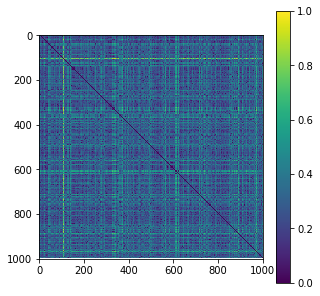

Eigs


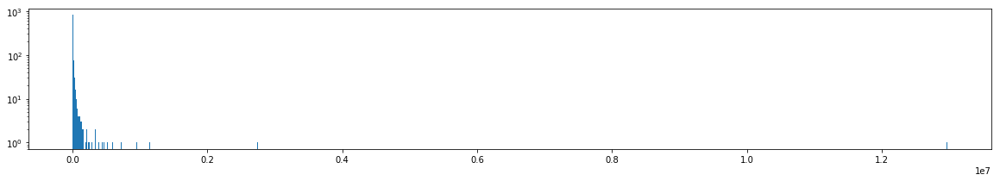

isomap 519
----------------------
CLASS  7
Linear eigendecomposition: 
498
Isomap with NN 2


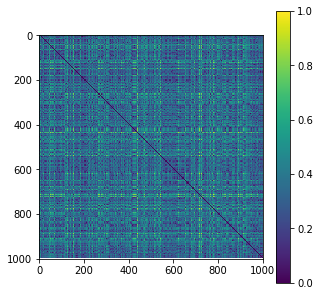

Eigs


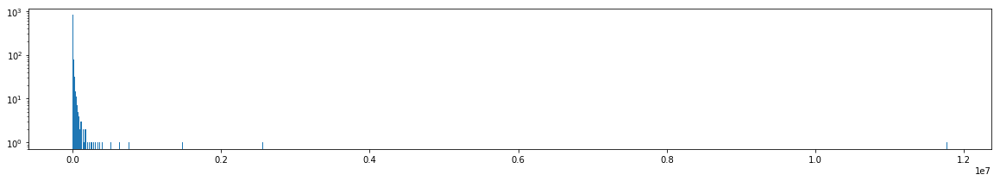

isomap 519
----------------------
CLASS  8
Linear eigendecomposition: 
498
Isomap with NN 2


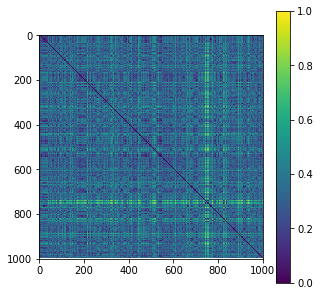

Eigs


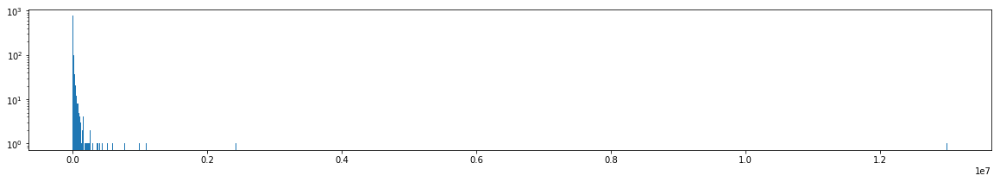

isomap 519
----------------------
CLASS  9
Linear eigendecomposition: 
475
Isomap with NN 2


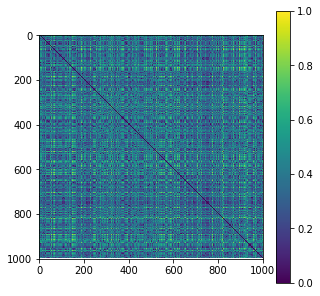

Eigs


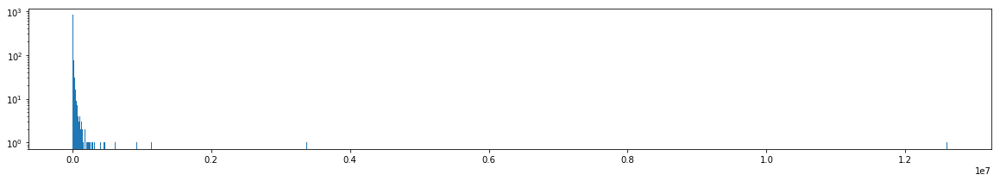

isomap 520


In [32]:
n_samples = 1000
n_neighbors = [2, 5, 10, 20, 50]
n_components = 550

class_vals = np.arange(10)

for class_ in class_vals:
    print('----------------------')
    print('CLASS % i' % class_)
    X = (X_tr[y_tr==class_][:n_samples]).reshape(-1,28*28)
    _, s_lin, _ = np.linalg.svd(X)
    print('Linear eigendecomposition: ')
    print(np.sum(s_lin>1e-3))
    
    for nn_ in n_neighbors:
        print('Isomap with NN %i' % nn_)
        isomap = ReducedIsomap(nn_, n_components)
        Y = isomap.fit_transform(X.reshape(-1,28*28))
        geodesic_dist = isomap.dist_matrix_
        _, iss_, _ = np.linalg.svd(geodesic_dist)
        plt.figure(figsize=(5,5))
        plt.imshow(geodesic_dist/np.max(geodesic_dist))
        plt.colorbar()
        plt.show()
        print('Eigs')
        plt.figure(figsize=(20,3))
        plt.yscale('log')
        plt.hist(iss_, bins=1000)
        plt.show()
        Y[np.isnan(Y)] = 0
        _, ss, _ = np.linalg.svd(Y)
        print('isomap', np.sum(ss>1e-3))
        
        break

## Difference with the Euclidean distance

Here we observe that while there is an increment in the dimensionality of the problem, the distances computed through the Isomap function are not affected by the presence of additional features, **the geodesic distances are preserved, and having more additional features does not harm, as long as they preserve the relative distance**

----------------------
CLASS  0
Linear eigendecomposition: 
1000


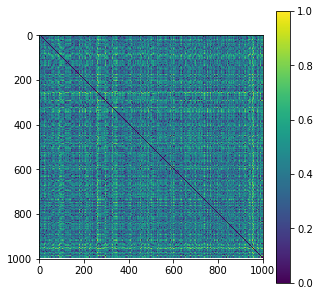

Eigs


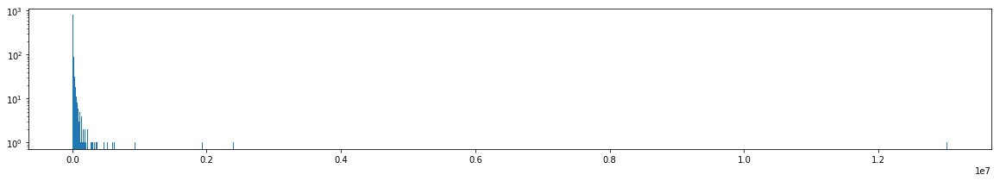

Eigs geodesic distance NN 2: 1000
Isomap with NN 2: 522


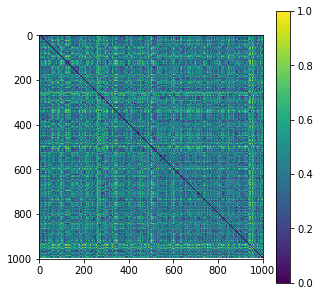

Eigs


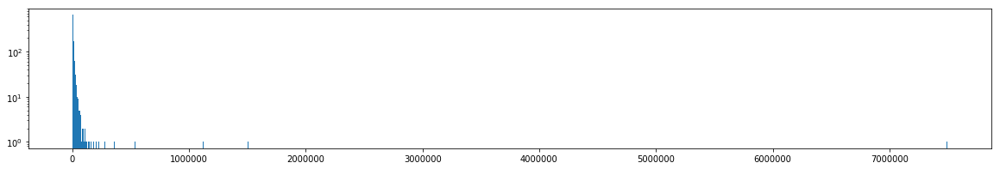

Eigs geodesic distance NN 5: 1000
Isomap with NN 5: 499


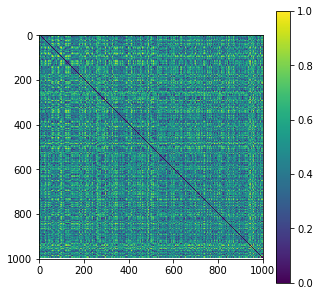

Eigs


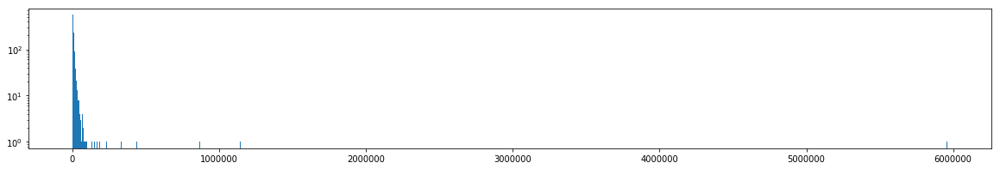

Eigs geodesic distance NN 10: 1000
Isomap with NN 10: 500


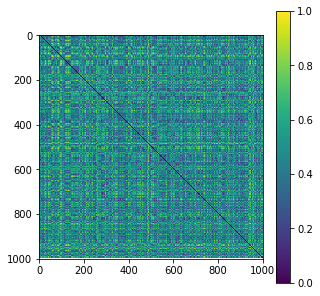

Eigs


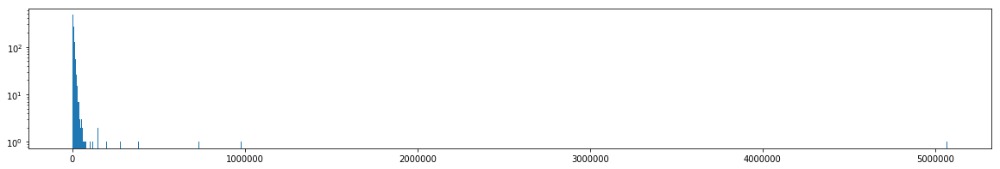

Eigs geodesic distance NN 20: 1000
Isomap with NN 20: 495


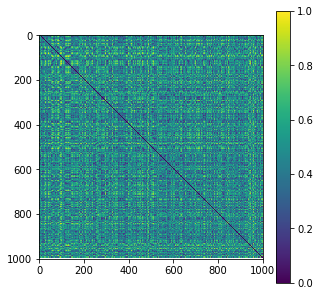

Eigs


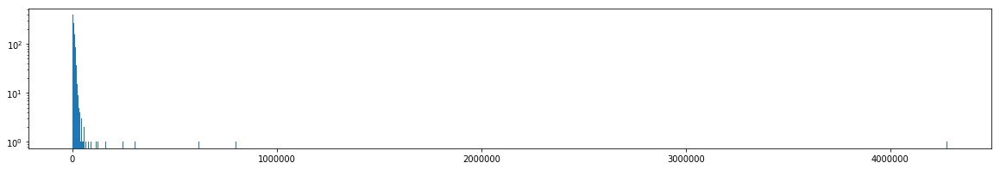

Eigs geodesic distance NN 50: 1000
Isomap with NN 50: 495
----------------------
CLASS  1
Linear eigendecomposition: 
1000


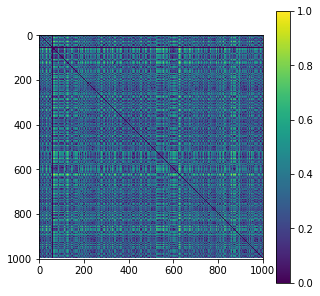

Eigs


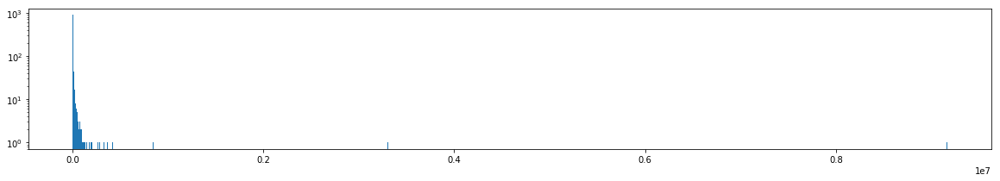

Eigs geodesic distance NN 2: 1000
Isomap with NN 2: 530


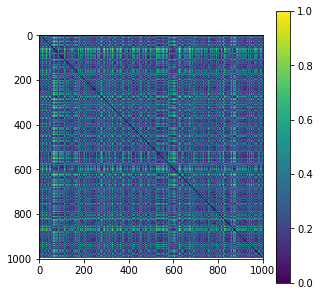

Eigs


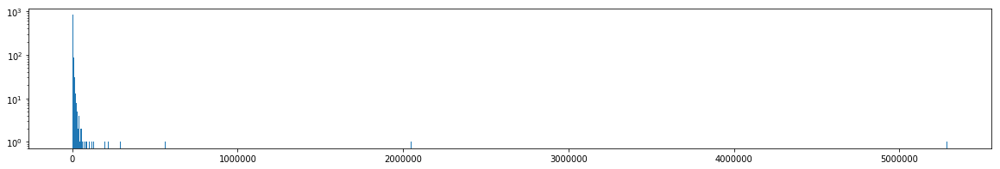

Eigs geodesic distance NN 5: 1000
Isomap with NN 5: 501


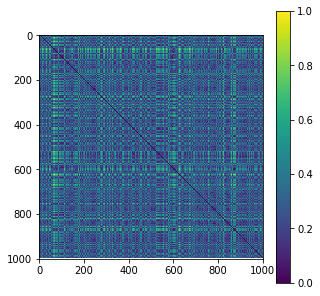

Eigs


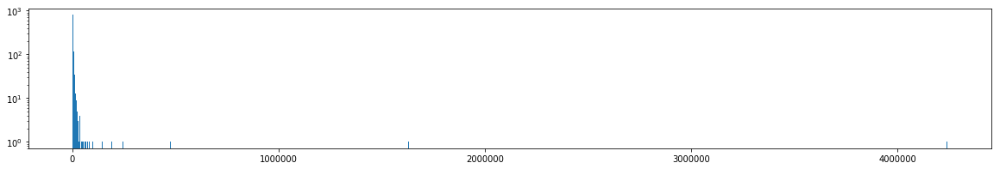

Eigs geodesic distance NN 10: 1000
Isomap with NN 10: 497


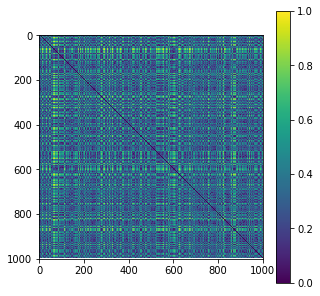

Eigs


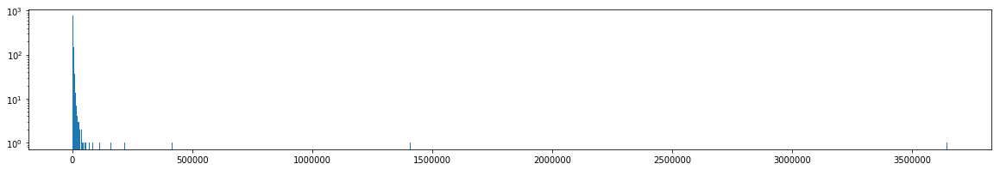

Eigs geodesic distance NN 20: 1000
Isomap with NN 20: 496


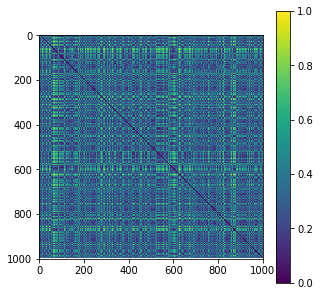

Eigs


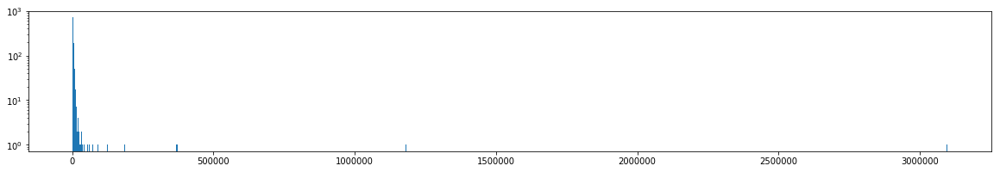

Eigs geodesic distance NN 50: 1000
Isomap with NN 50: 500
----------------------
CLASS  2
Linear eigendecomposition: 
1000


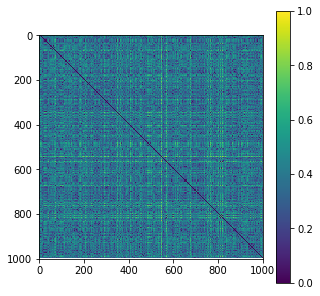

Eigs


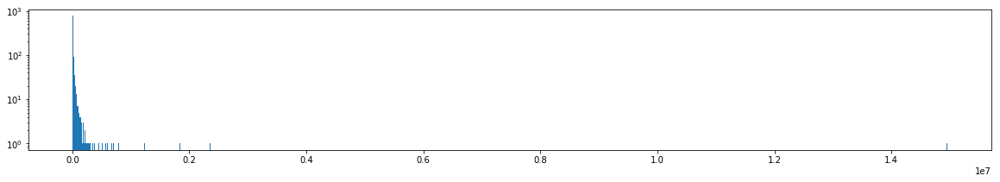

Eigs geodesic distance NN 2: 1000
Isomap with NN 2: 509


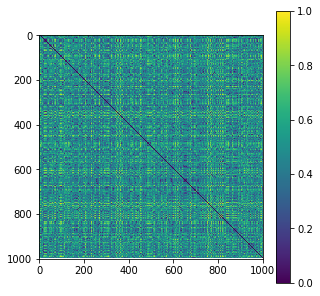

Eigs


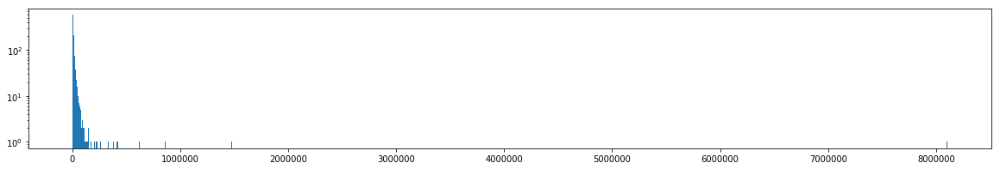

Eigs geodesic distance NN 5: 1000
Isomap with NN 5: 501


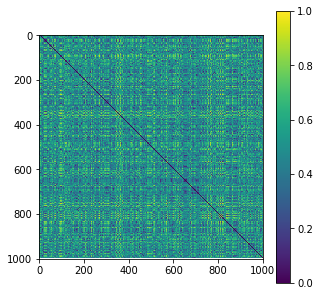

Eigs


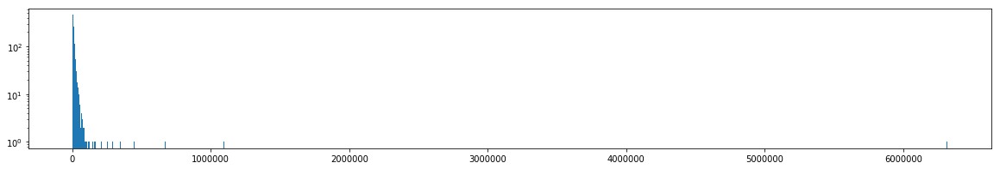

Eigs geodesic distance NN 10: 1000
Isomap with NN 10: 495


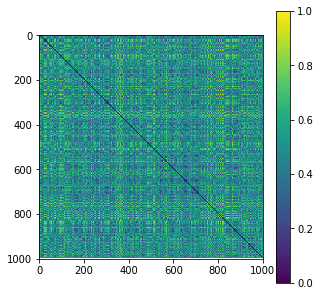

Eigs


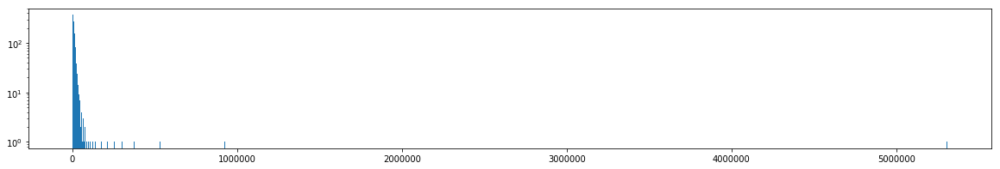

Eigs geodesic distance NN 20: 1000
Isomap with NN 20: 498


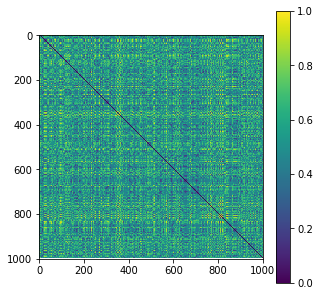

Eigs


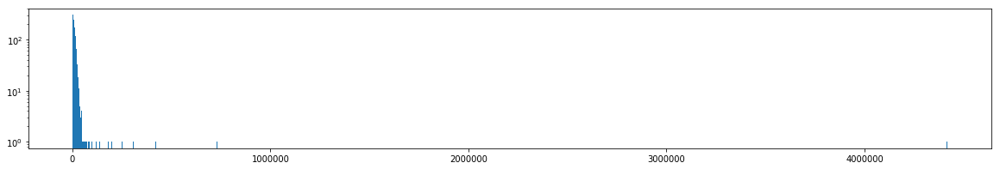

Eigs geodesic distance NN 50: 1000
Isomap with NN 50: 495
----------------------
CLASS  3
Linear eigendecomposition: 
1000


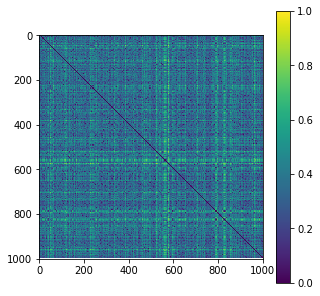

Eigs


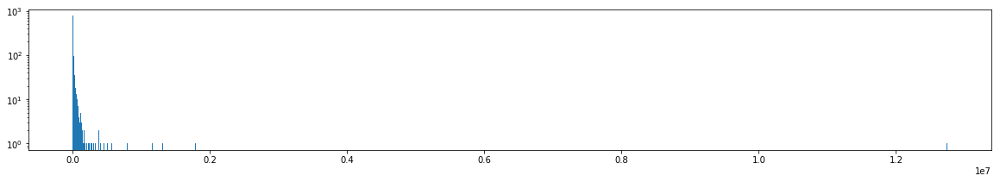

Eigs geodesic distance NN 2: 1000
Isomap with NN 2: 514


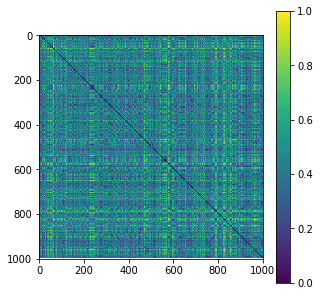

Eigs


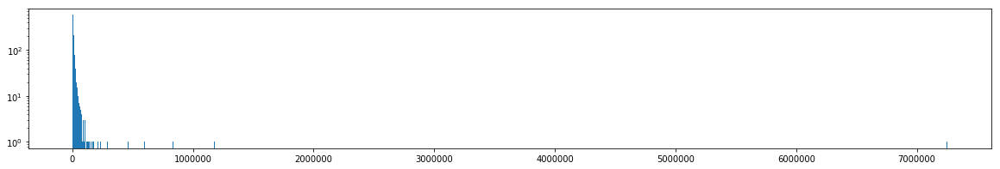

Eigs geodesic distance NN 5: 1000
Isomap with NN 5: 499


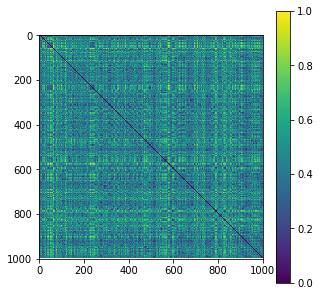

Eigs


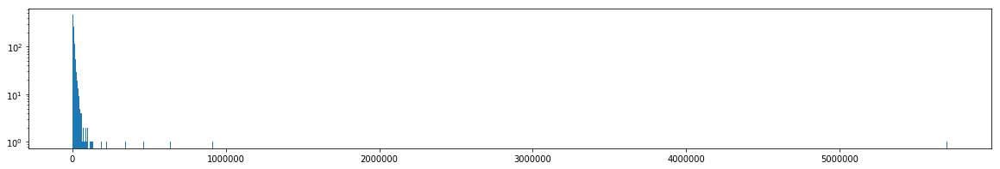

Eigs geodesic distance NN 10: 1000
Isomap with NN 10: 497


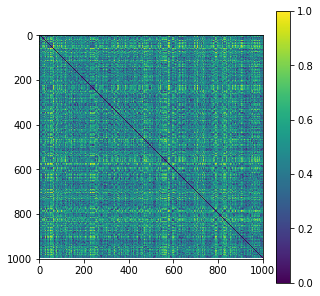

Eigs


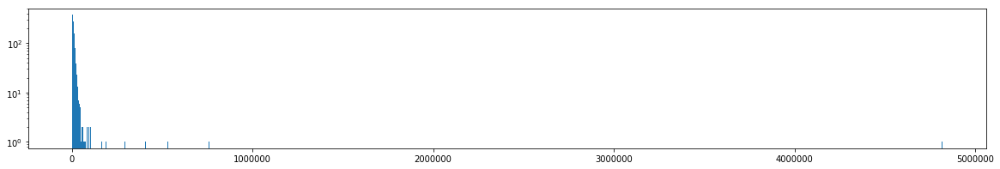

Eigs geodesic distance NN 20: 1000
Isomap with NN 20: 495


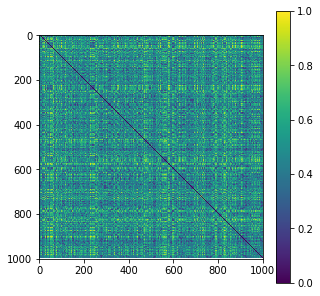

Eigs


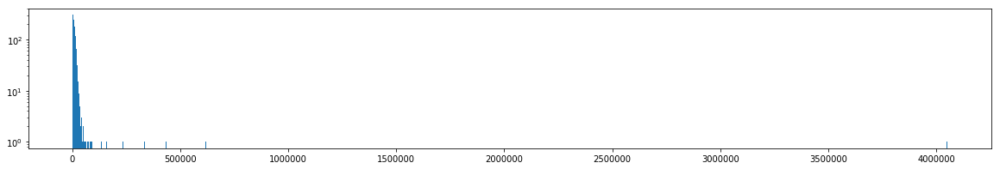

Eigs geodesic distance NN 50: 1000
Isomap with NN 50: 492
----------------------
CLASS  4
Linear eigendecomposition: 
1000


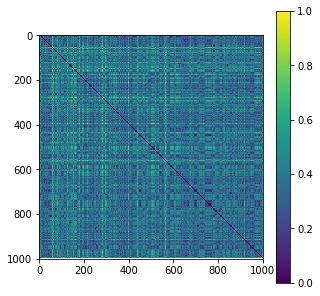

Eigs


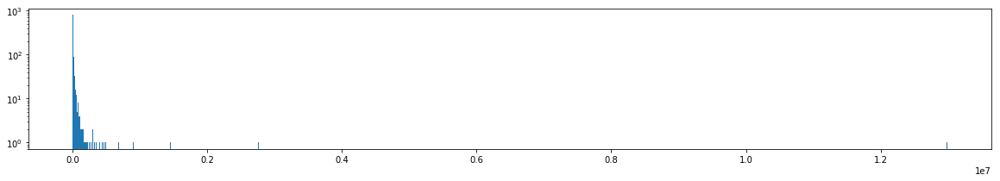

Eigs geodesic distance NN 2: 1000
Isomap with NN 2: 516


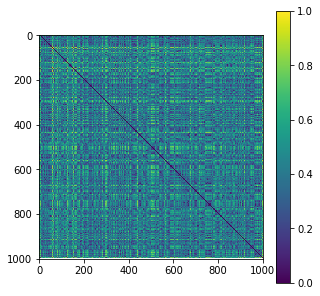

Eigs


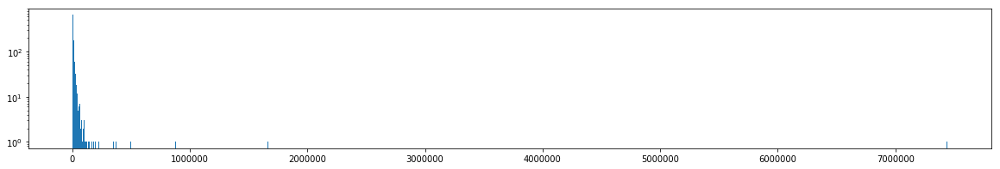

Eigs geodesic distance NN 5: 1000
Isomap with NN 5: 500


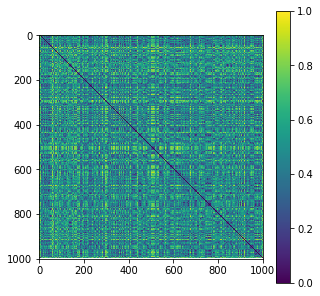

Eigs


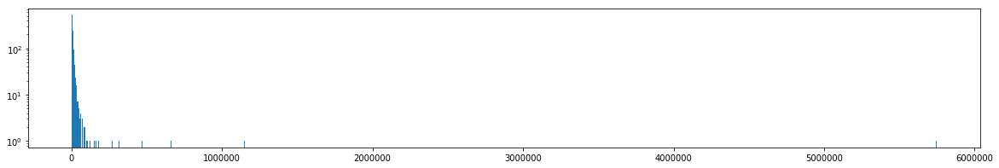

Eigs geodesic distance NN 10: 1000
Isomap with NN 10: 498


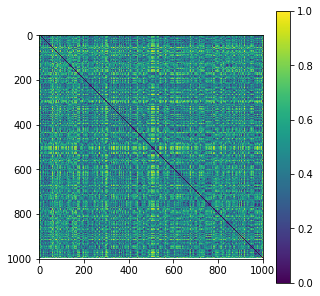

Eigs


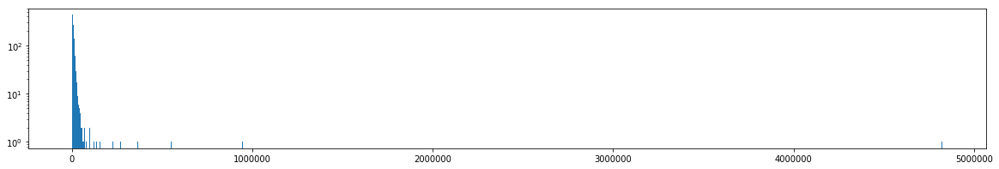

Eigs geodesic distance NN 20: 1000
Isomap with NN 20: 496


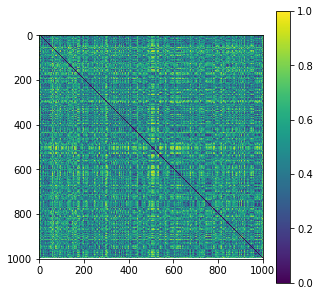

Eigs


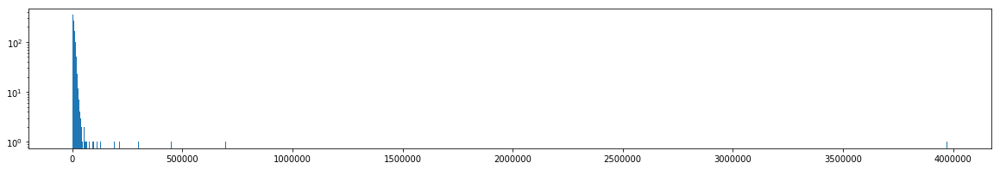

Eigs geodesic distance NN 50: 1000
Isomap with NN 50: 494
----------------------
CLASS  5
Linear eigendecomposition: 
1000


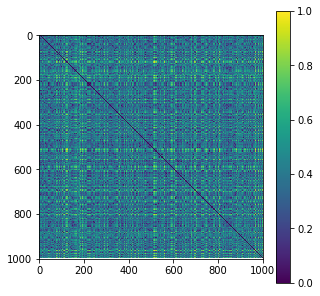

Eigs


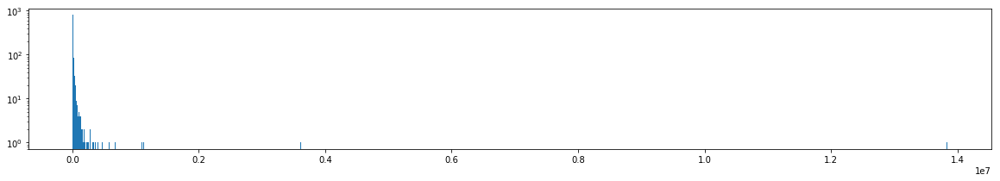

Eigs geodesic distance NN 2: 1000
Isomap with NN 2: 517


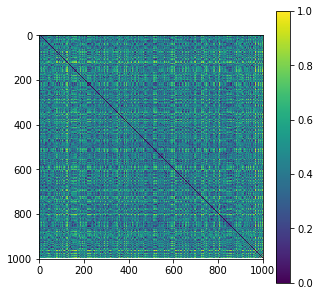

Eigs


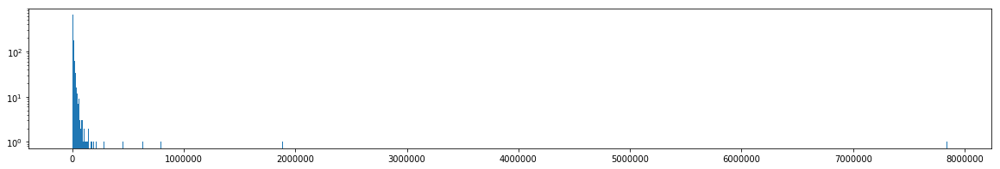

Eigs geodesic distance NN 5: 1000
Isomap with NN 5: 497


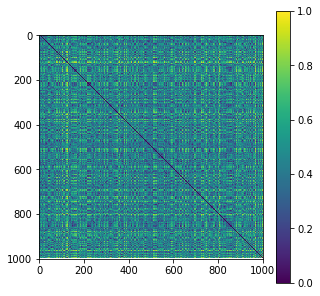

Eigs


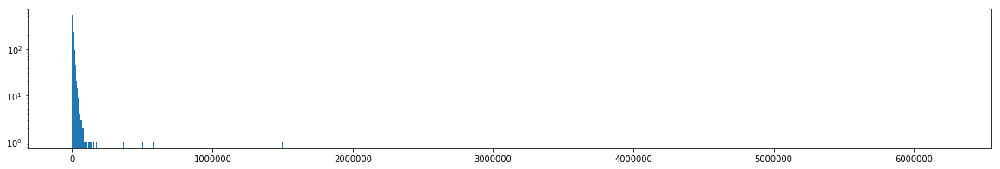

Eigs geodesic distance NN 10: 1000
Isomap with NN 10: 500


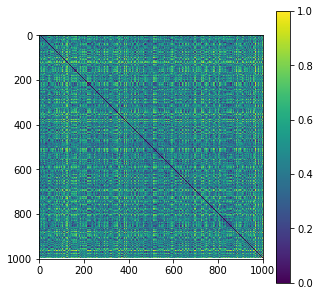

Eigs


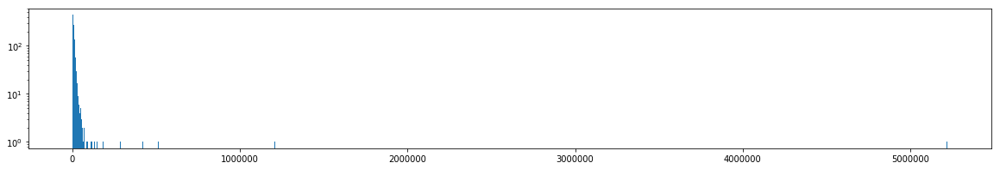

Eigs geodesic distance NN 20: 1000
Isomap with NN 20: 498


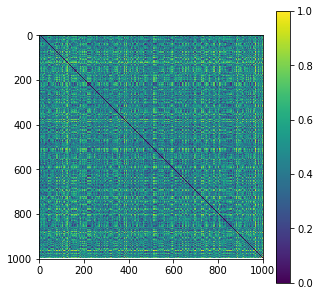

Eigs


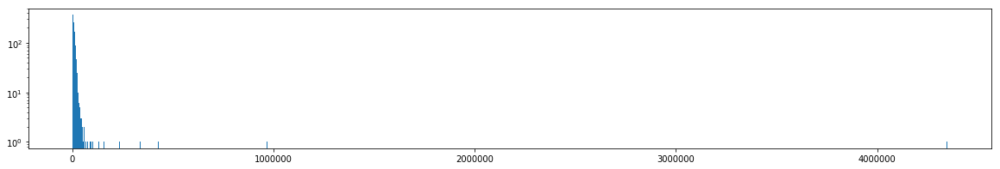

Eigs geodesic distance NN 50: 1000
Isomap with NN 50: 495
----------------------
CLASS  6
Linear eigendecomposition: 
1000


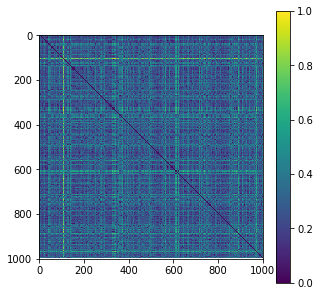

Eigs


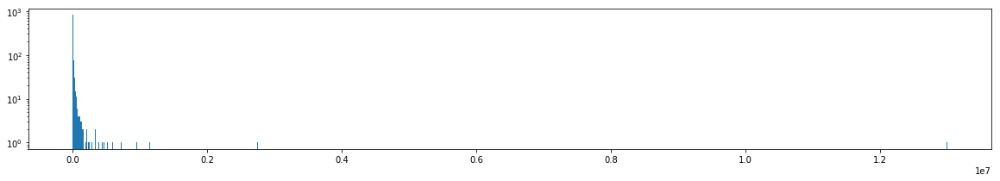

Eigs geodesic distance NN 2: 1000
Isomap with NN 2: 524


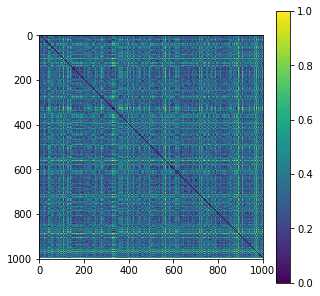

Eigs


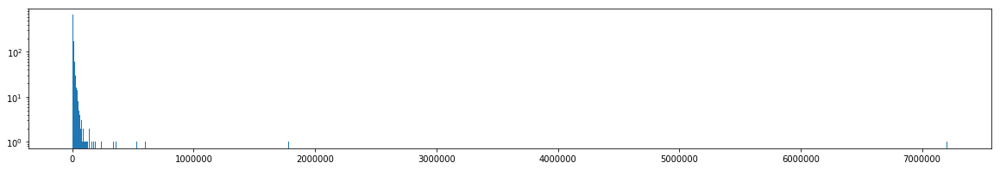

Eigs geodesic distance NN 5: 1000
Isomap with NN 5: 499


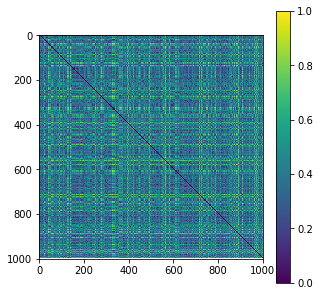

Eigs


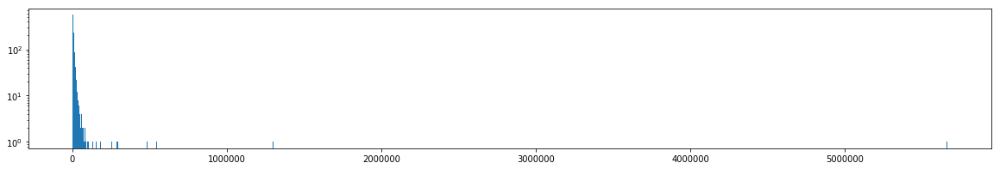

Eigs geodesic distance NN 10: 1000
Isomap with NN 10: 497


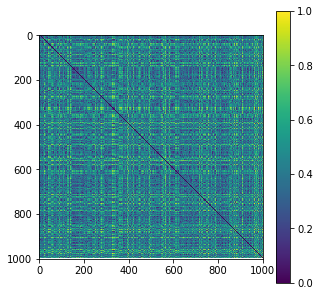

Eigs


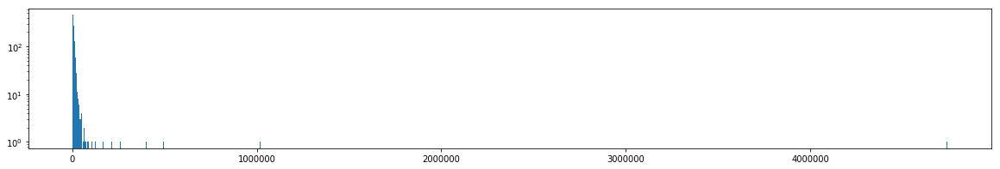

Eigs geodesic distance NN 20: 1000
Isomap with NN 20: 495


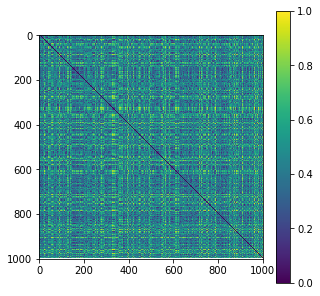

Eigs


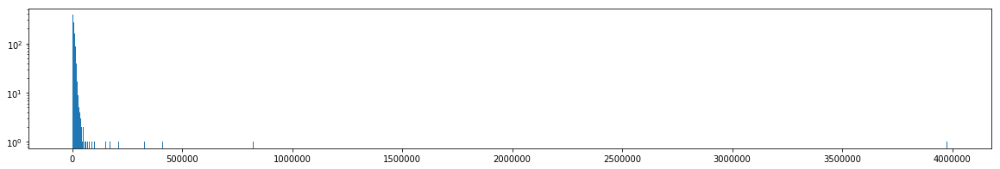

Eigs geodesic distance NN 50: 1000
Isomap with NN 50: 494
----------------------
CLASS  7
Linear eigendecomposition: 
1000


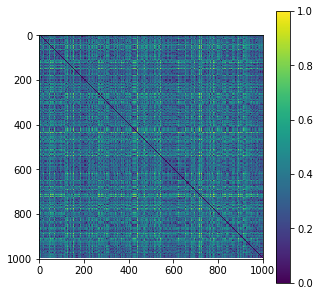

Eigs


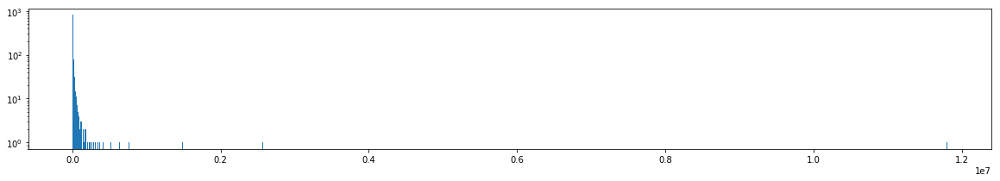

Eigs geodesic distance NN 2: 1000
Isomap with NN 2: 520


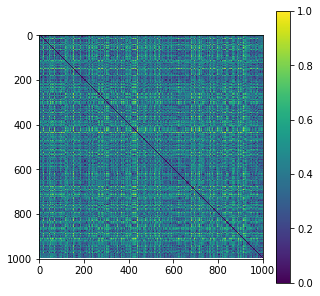

Eigs


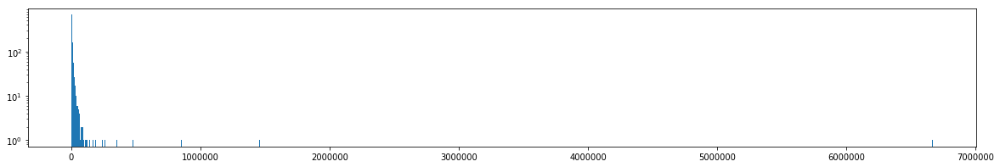

Eigs geodesic distance NN 5: 1000
Isomap with NN 5: 499


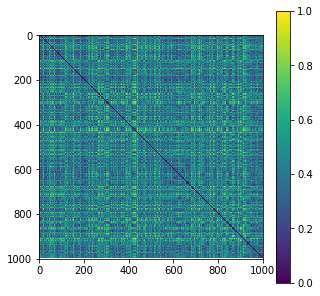

Eigs


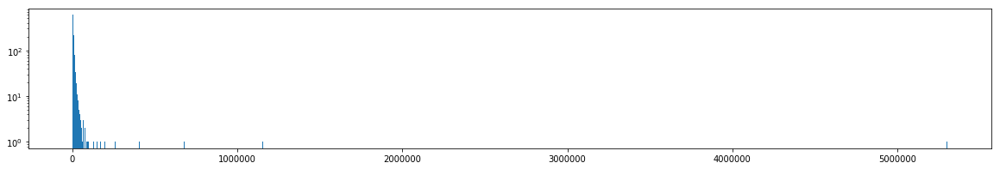

Eigs geodesic distance NN 10: 1000
Isomap with NN 10: 497


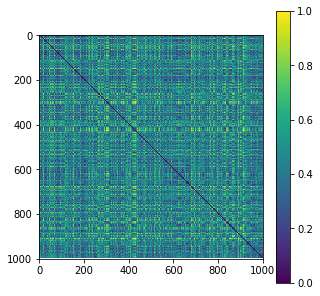

Eigs


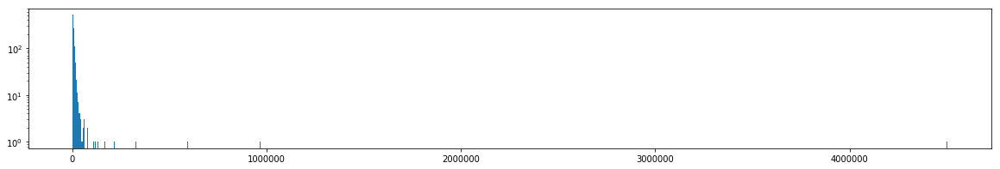

Eigs geodesic distance NN 20: 1000
Isomap with NN 20: 496


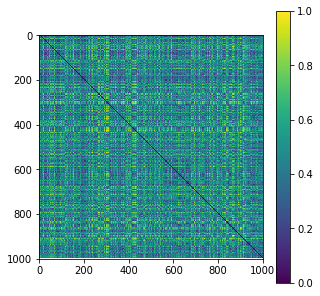

Eigs


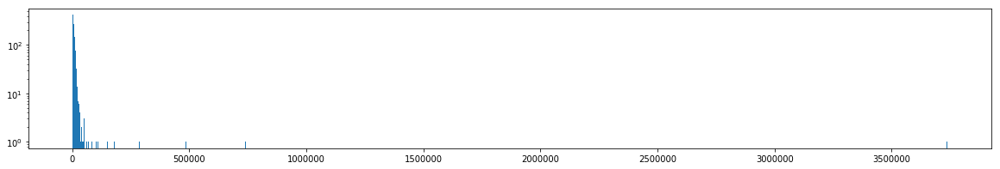

Eigs geodesic distance NN 50: 1000
Isomap with NN 50: 494
----------------------
CLASS  8
Linear eigendecomposition: 
1000


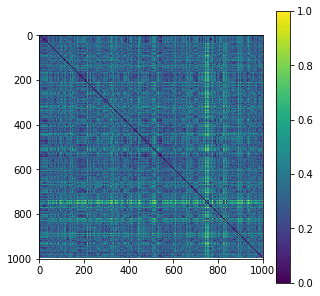

Eigs


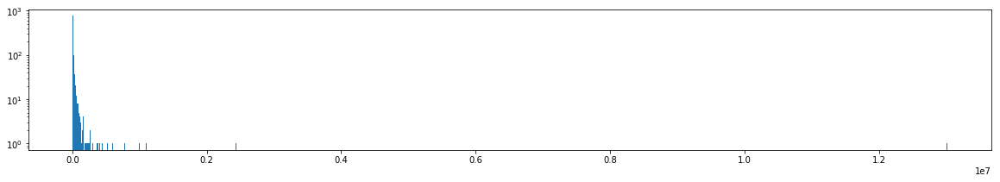

Eigs geodesic distance NN 2: 1000
Isomap with NN 2: 520


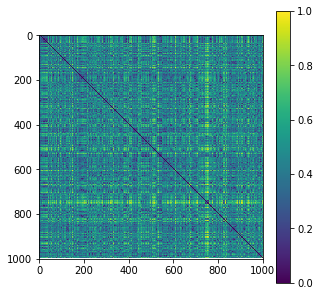

Eigs


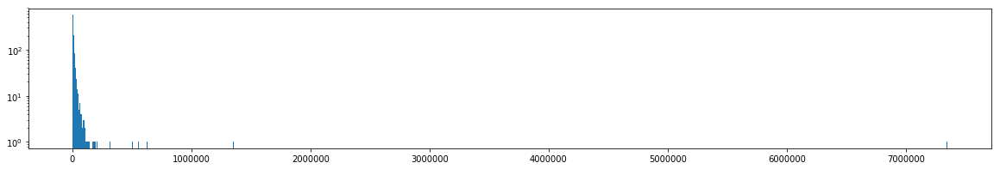

Eigs geodesic distance NN 5: 1000
Isomap with NN 5: 498


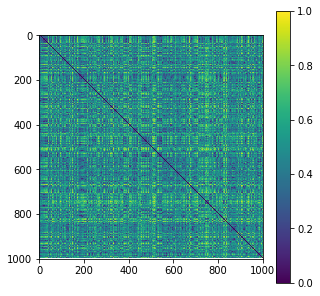

Eigs


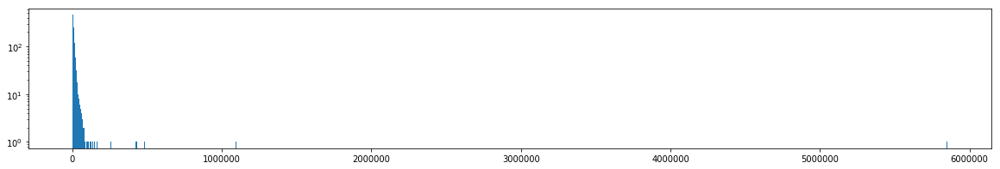

Eigs geodesic distance NN 10: 1000
Isomap with NN 10: 497


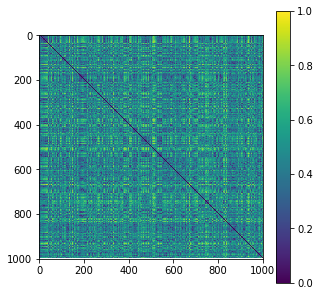

Eigs


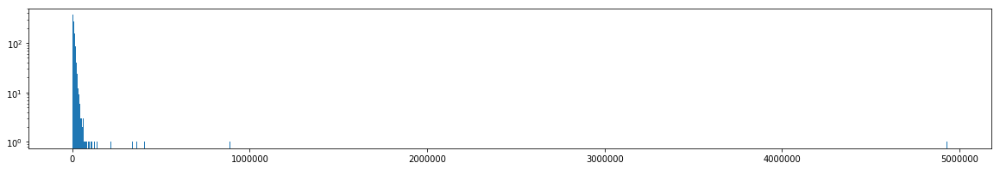

Eigs geodesic distance NN 20: 1000
Isomap with NN 20: 496


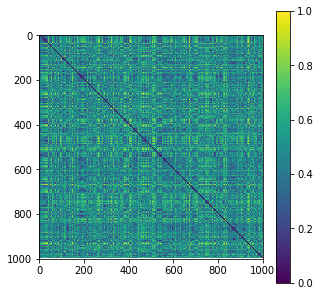

Eigs


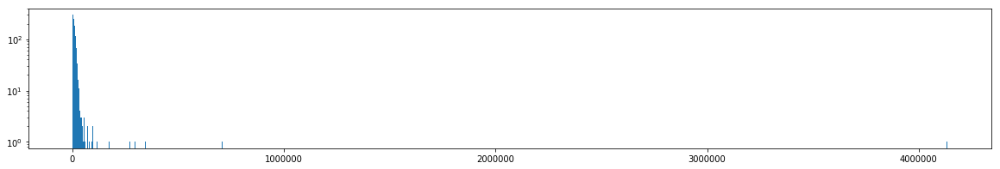

Eigs geodesic distance NN 50: 1000
Isomap with NN 50: 492
----------------------
CLASS  9
Linear eigendecomposition: 
1000


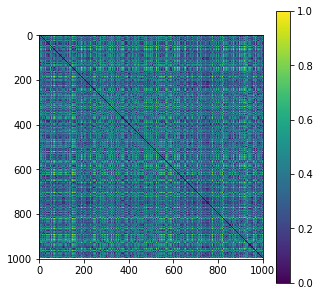

Eigs


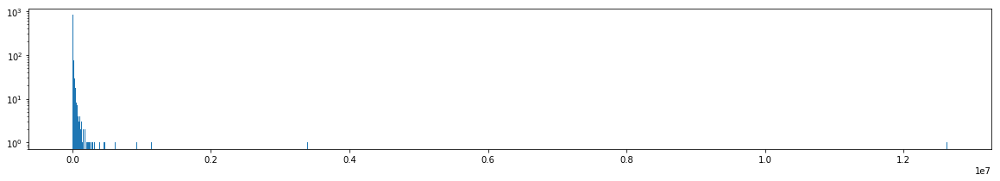

Eigs geodesic distance NN 2: 1000
Isomap with NN 2: 519


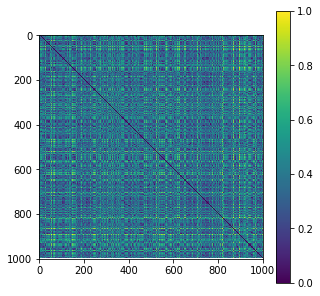

Eigs


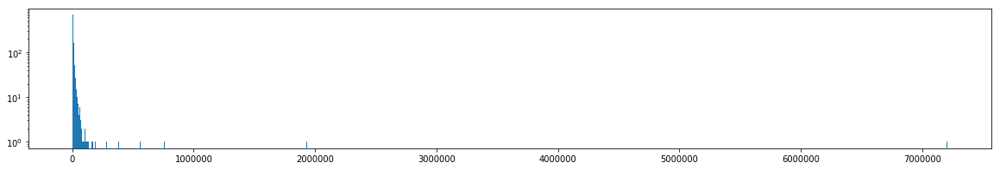

Eigs geodesic distance NN 5: 1000
Isomap with NN 5: 499


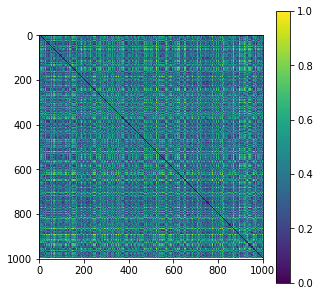

Eigs


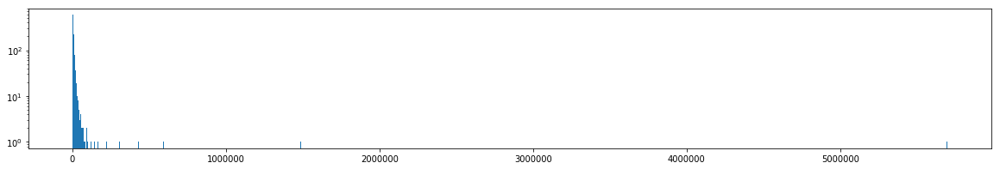

Eigs geodesic distance NN 10: 1000
Isomap with NN 10: 498


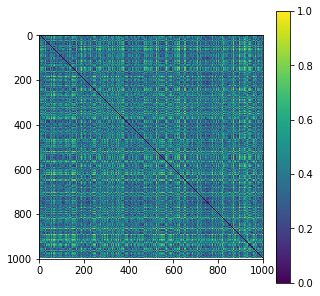

Eigs


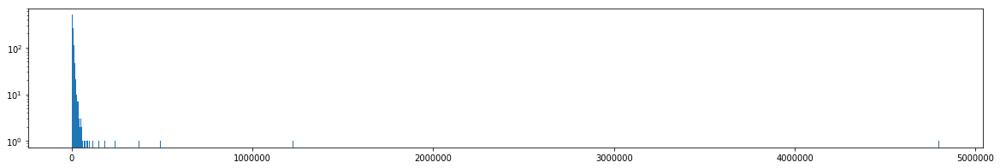

Eigs geodesic distance NN 20: 1000
Isomap with NN 20: 498


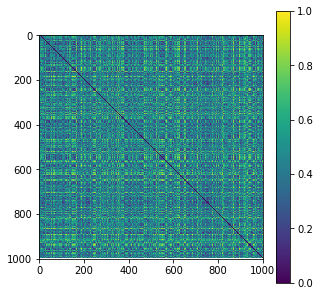

Eigs


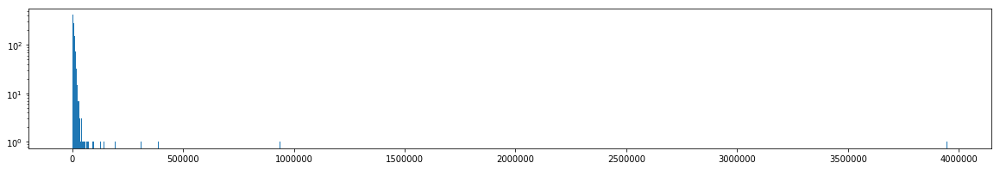

Eigs geodesic distance NN 50: 1000
Isomap with NN 50: 493


In [34]:
n_samples = 1000
n_neighbors = [2, 5, 10, 20, 50]
n_components = 1000
new_dim = 60

class_vals = np.arange(10)
new_X = np.random.randn(n_samples, new_dim, new_dim)

for class_ in class_vals:
    print('----------------------')
    print('CLASS % i' % class_)
    tmp_new_X = new_X.copy()
    tmp_new_X[:, 28:56, 28:56] = X_tr[y_tr==class_][:n_samples]
    X = tmp_new_X.reshape(-1,new_dim*new_dim)
    _, s_lin, _ = np.linalg.svd(X)
    print('Linear eigendecomposition: ')
    print(np.sum(s_lin>1e-3))
    
    for nn_ in n_neighbors:
        isomap = ReducedIsomap(nn_, n_components)
        Y = isomap.fit_transform(X.reshape(-1,new_dim*new_dim))
        geodesic_dist = isomap.dist_matrix_
        _, iss_, _ = np.linalg.svd(geodesic_dist)
        plt.figure(figsize=(5,5))
        plt.imshow(geodesic_dist/np.max(geodesic_dist))
        plt.colorbar()
        plt.show()
        print('Eigs')
        plt.figure(figsize=(20,3))
        plt.yscale('log')
        plt.hist(iss_, bins=1000)
        plt.show()
        print('Eigs geodesic distance NN %i: %i' % (nn_, np.sum(iss_>1e-1)))
        Y[np.isnan(Y)] = 0
        _, ss, _ = np.linalg.svd(Y)
        print('Isomap with NN %i: %i' % (nn_, np.sum(ss>1e-3)))

In [ ]:
xxx = np.identity(10)
xxx[-1,-1] = np.nan
xxx[-1,1] = np.nan
xxx [np.isnan(xxx)] = 0
_, s, _ = np.linalg.svd(xxx)
s